## MINIPROYECTO 1: Análisis Multivariado de Señales Sismográficas

Vanessa Jaramillo Sánchez

Jonny Taborda Acosta

Carlos Andres Posada Chica

*Tratamiento de Señales III*

*Facultad de Ingeniería*

*Prof. Hernán Felipe García*

*2021*

In [118]:
!pip install pyts



In [119]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.decomposition import SingularSpectrumAnalysis
import scipy.io as sc
from scipy.signal import stft, bode, butter, lfilter,freqz
from scipy import signal
import pandas as pd
import seaborn as sns


# Filtros

En el siguiente bloque de código definimos diferentes filtros de los cuales escogeremos uno para trabajar. 

In [120]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_lowpass(cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)    
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y
def butter_lowpass_bode (b ,a):
    angularFreq, freqResponse, phaseResponse = scipy.signal.bode(scipy.signal.lti(b, a))

    return angularFreq, freqResponse, phaseResponse

def butter_bandpass_bode (b ,a):
    angularFreq, freqResponse, phaseResponse = scipy.signal.bode(scipy.signal.lti(b, a))

    return angularFreq, freqResponse, phaseResponse

## Trabajaremos en tres secciones dependiendo del tipo de sismo (Local, Regional y Telesismo)

# Sismo Local

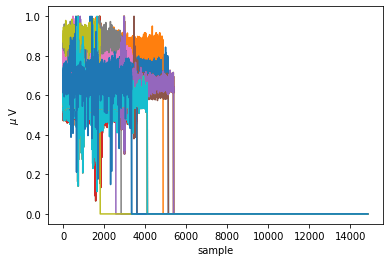

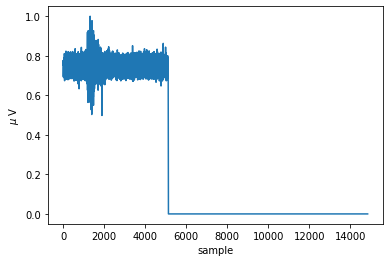

In [121]:
dataLoc = sc.loadmat('sisLoc.mat')#retorna los datos que lee de matlab
dataLoc.keys() # variables del diccionario

Y = dataLoc['Y']# variables
fs1 = dataLoc['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(Y.T)#trasponer
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()
sampleSignal = Y[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


<Figure size 432x288 with 0 Axes>

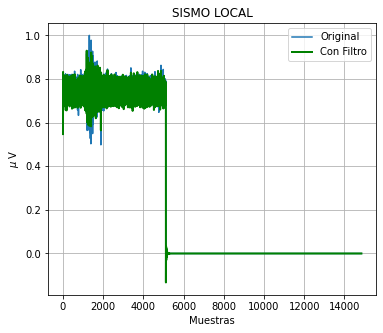

In [122]:
#------------------------------------------------------fILTRADO
#-------------------------------------------------PASA BAJAS
fsnull = 102.0 #Debe cumplir el principio de Nyquist
lowcutnull = 1
highcutnull = 49
ordernull = 6

signalFilteredLocnull = np.zeros((21,14848))

for i in range(0,21):
  signalFilteredLocnull[i,:] = butter_lowpass_filter(Y[i,:],highcutnull, fsnull, ordernull)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Y[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredLocnull[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO LOCAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

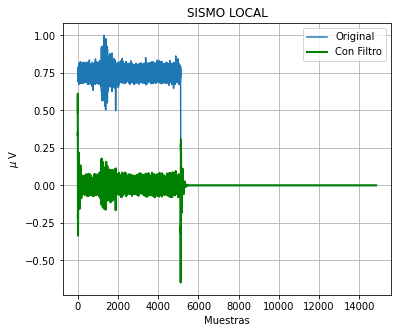

In [123]:
#-------------------------------------------------PASA BANDAS
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 49
order = 6

signalFilteredLoc = np.zeros((21,14848))

for i in range(0,21):
 signalFilteredLoc[i,:] = butter_bandpass_filter(Y[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Y[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredLoc[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO LOCAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

Inicialmente se implementa un filtro PASA BAJAS, identificamos que la mayor parte de energía se concentra en el cero frecuencial haciendo que en los espectogramas fuera difícil identificar el comportamiento de la señal, ademas, obteniendo ceros de energía en los valores de máxima frecuencia en la matriz concatenada, por tal motivo se decide trabajar con un filtro PASA BANDAS, donde el comportamiento de la señal toma mas relevancia tanto en los espectogramas como en los valores de la matriz concatenada.

# MAGNITUD Y FASE

<Figure size 432x288 with 0 Axes>

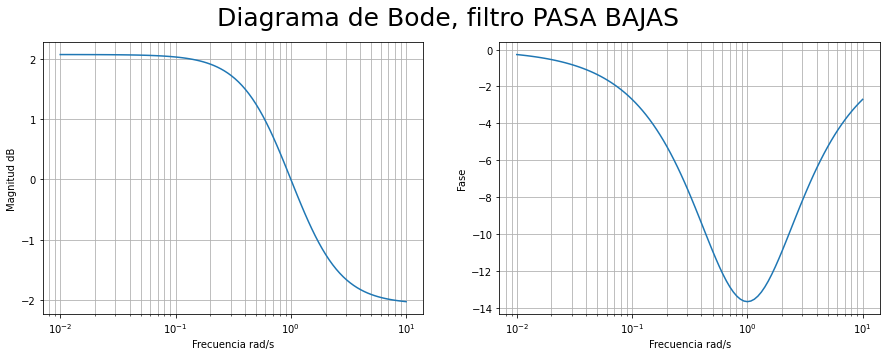

In [124]:
#---------------------------------------------GRAFICA MAGNITUD Y FASE
#----------------------PASA BAJAS
b,a= butter_lowpass(highcut, fs,order)
sys = (b,a) # Creamos el sistema
w, mag, phase = signal.bode(sys) # Diagrama de bode: frecuencias, magnitud y fase


#plt.semilogx(w, mag) # Eje x logarítmico
#plt.semilogx(w, phase) # Eje x logarítmico

plt.figure()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.semilogx(w,mag)
plt.suptitle('Diagrama de Bode, filtro PASA BAJAS',fontsize=25)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Magnitud dB')
plt.grid(True, which="both")

plt.subplot(1,2,2)
plt.semilogx(w,phase)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Fase')
plt.grid(True, which="both")



<Figure size 432x288 with 0 Axes>

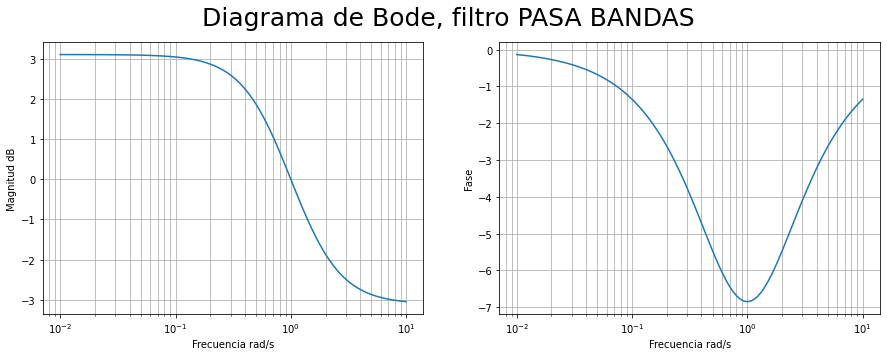

In [125]:
#---------------------------------------------GRAFICA MAGNITUD Y FASE
#----------------------PASA BANDAS
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 49
order = 6
b,a= butter_bandpass(lowcut, highcut, fs, order)


sys = (b,a) # Creamos el sistema
w, mag, phase = bode(sys) # Diagrama de bode: frecuencias, magnitud y fase


#plt.semilogx(w, mag) # Eje x logarítmico
#plt.semilogx(w, phase) # Eje x logarítmico

plt.figure()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.semilogx(w,mag)
plt.suptitle('Diagrama de Bode, filtro PASA BANDAS',fontsize=25)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Magnitud dB')
plt.grid(True, which="both")

plt.subplot(1,2,2)
plt.semilogx(w,phase)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Fase')
plt.grid(True, which="both")

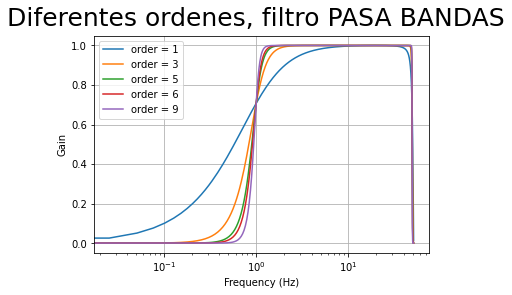

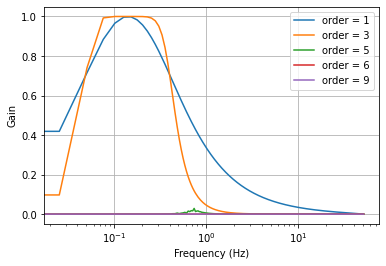

In [126]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

if __name__ == "__main__":
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz  
    # Sample rate and desired cutoff frequencies (in Hz).
    fs = 102.0
    # Plot the frequency response for a few different orders.
    plt.figure(1)
    plt.clf()
    plt.suptitle('Diferentes ordenes, filtro PASA BANDAS',fontsize=25)
    for order in [1, 3, 5, 6, 9]:
        b, a = butter_bandpass(1, 49, fs, order=order)
        w, h = freqz(b, a, worN=2000)#np.logspace(-4, 3, 2000))
        plt.semilogx((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)  
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')

    plt.figure(2)
    plt.clf()
    for order in [1, 3, 5, 6, 9]:
        b, a = butter_bandpass(0.05, 0.4, fs, order=order)
        w, h = freqz(b, a, worN=2000)#np.logspace(-4, 3, 2000))
        plt.semilogx((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)  
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')

    plt.show()

De lo anterior podemos concluir lo siguiente:
Las graficas que podemos observar para el diagrama de Fase en "Pasa Bajas" y "Pasa Bandas" tienen el mismo comportamiento pero sus amplitudes son diferentes debido al filtro que se utiliza.
Se decide trabajar con un orden de $6$ ya que se utiliza un valor intermedio de roll-off, éste es mas corto y no afectar la señal, para valores cortos de Roll-off  la señal se tiende a distorcionar. 

## Separación de las señales en tres grupos

<function matplotlib.pyplot.show>

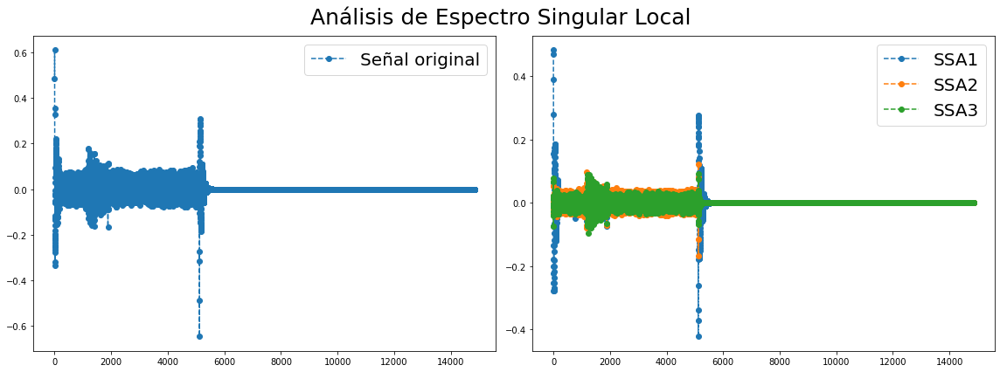

In [127]:
LOCAL = signalFilteredLoc
Grup= 3
SSA= SingularSpectrumAnalysis(window_size=Grup)
LOCALssa = SSA.fit_transform(LOCAL)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Local',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(LOCAL[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup):
  ax2.plot(LOCALssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

Podemos apreciar las señales; para el lado izquierdo encontramos la señal original, en el lado derecho encontramos las señales en diferentes colores dependiendo de sus componentes frecuenciales.

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff66b497310>,
 [<matplotlib.lines.Line2D at 0x7ff66b4079d0>])

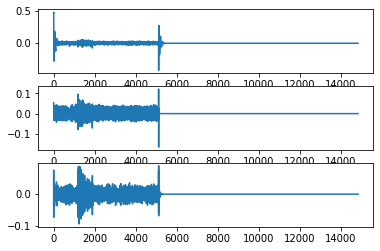

In [128]:
plt.subplot(3,1,1),plt.plot(LOCALssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(LOCALssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(LOCALssa[idsignal, 2])

Observamos el comportamiento por separado de cada  una de las señales.

# Analisis en Frecuencia. STFT

Repesentación de los espectrogramas donde visualizamos las componentes frecuenciales por unidad de tiempo, realizamos la transformada de fourier corta para cada señal.

STFT para las señales: 1


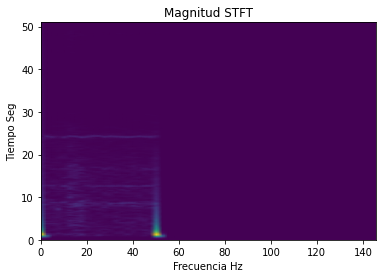

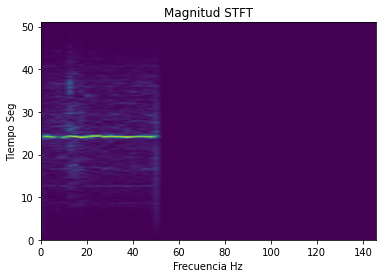

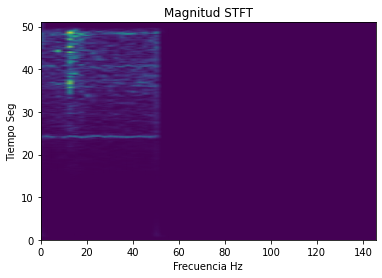

STFT para las señales: 2


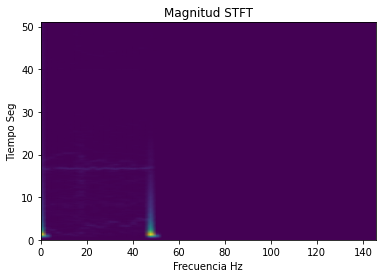

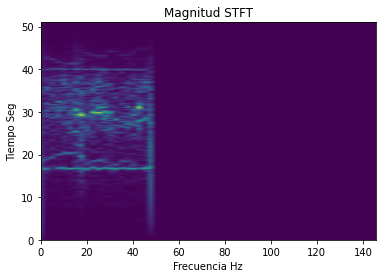

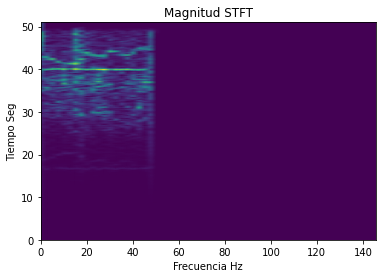

STFT para las señales: 3


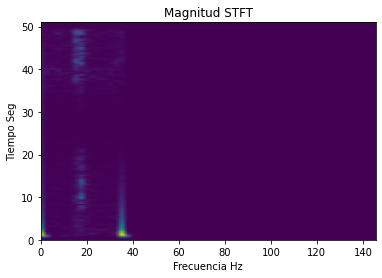

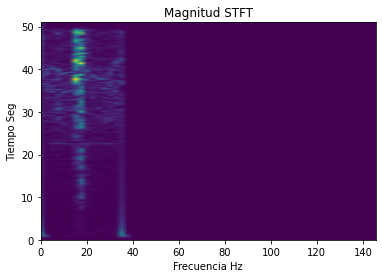

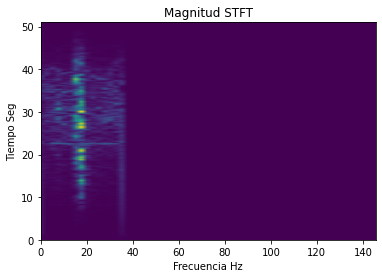

STFT para las señales: 4


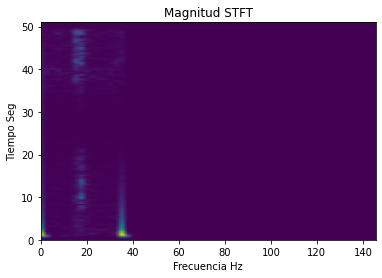

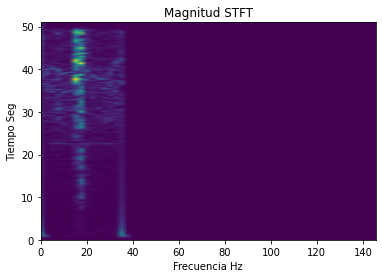

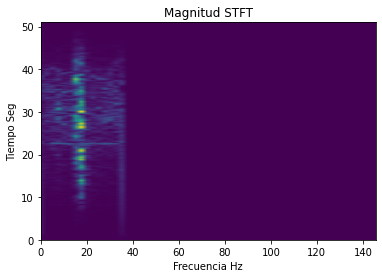

STFT para las señales: 5


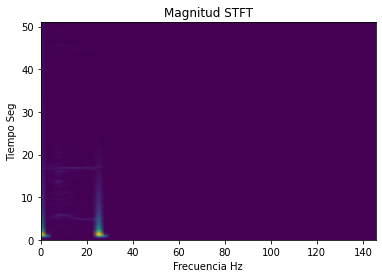

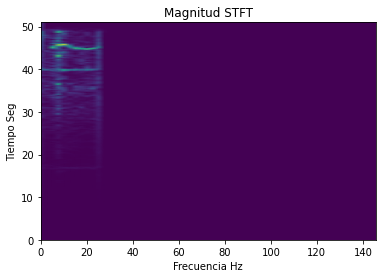

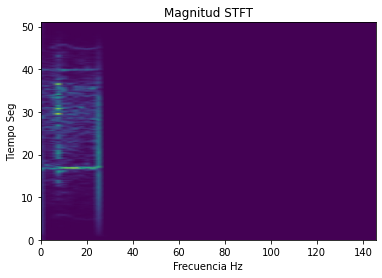

STFT para las señales: 6


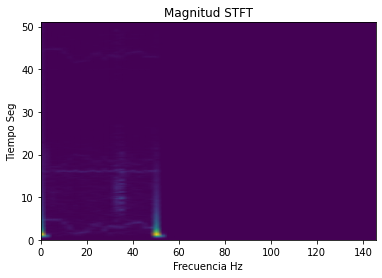

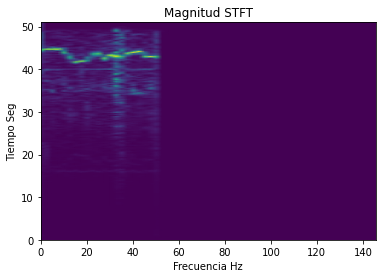

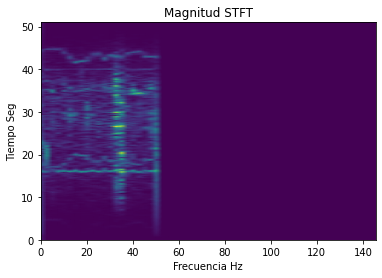

STFT para las señales: 7


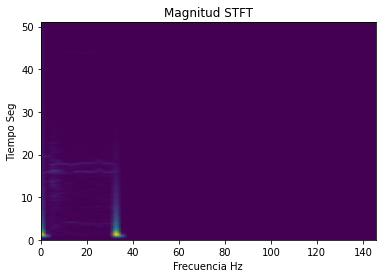

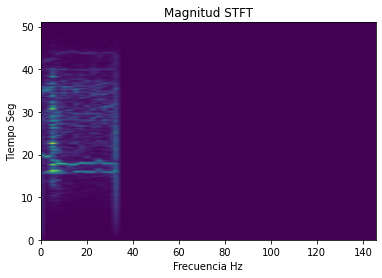

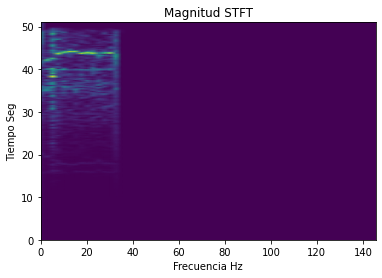

STFT para las señales: 8


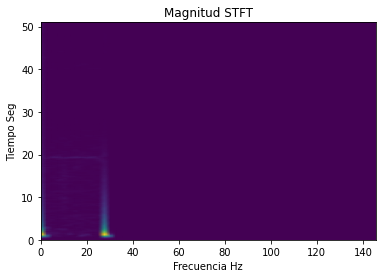

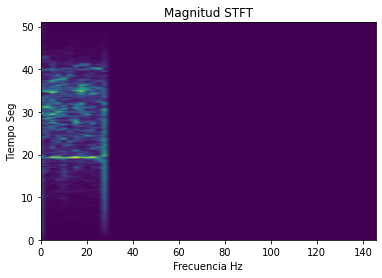

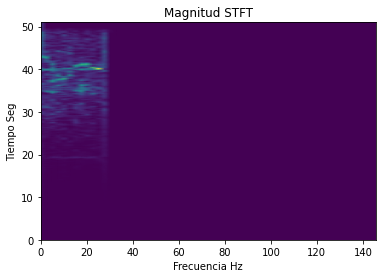

STFT para las señales: 9


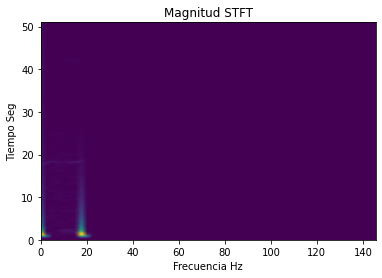

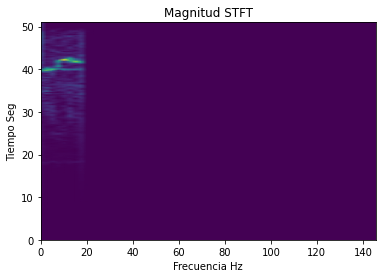

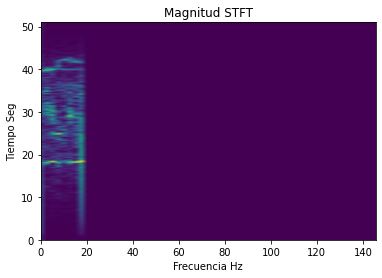

STFT para las señales: 10


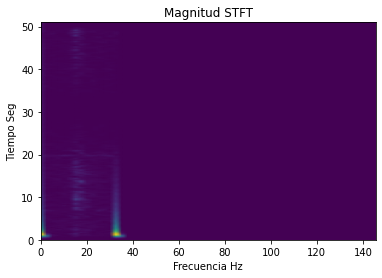

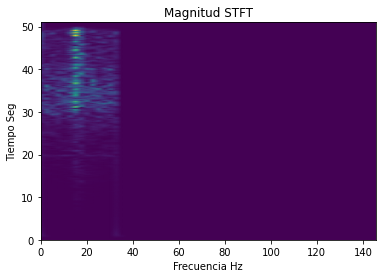

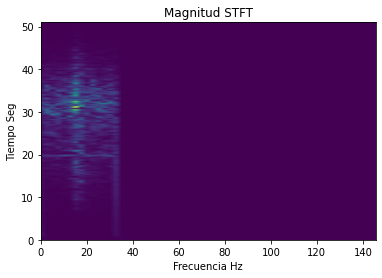

STFT para las señales: 11


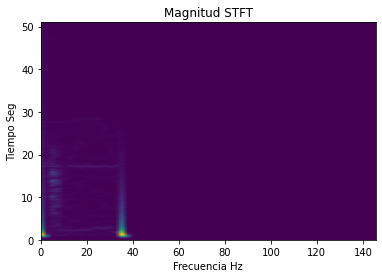

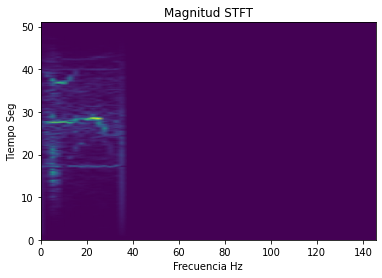

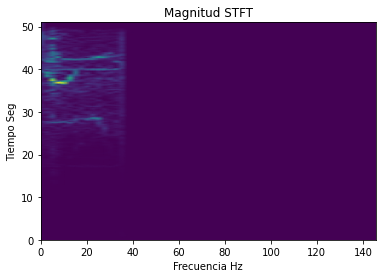

STFT para las señales: 12


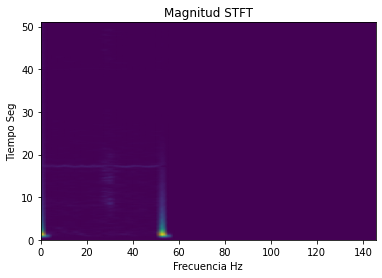

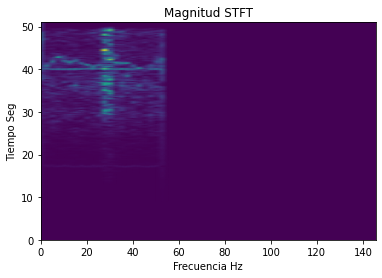

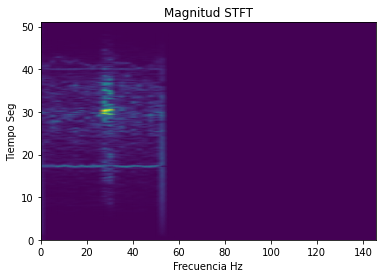

STFT para las señales: 13


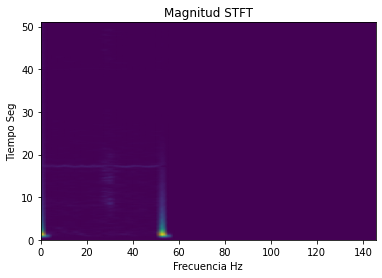

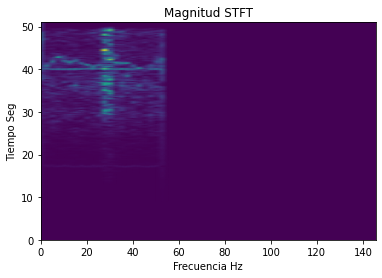

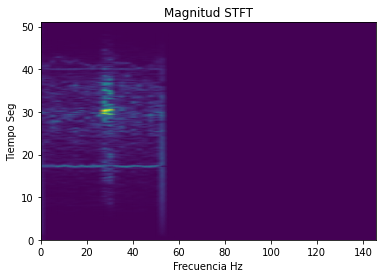

STFT para las señales: 14


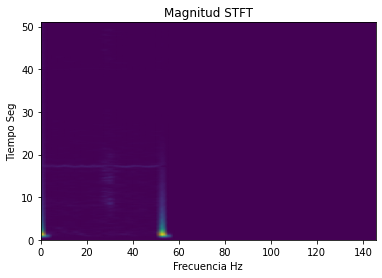

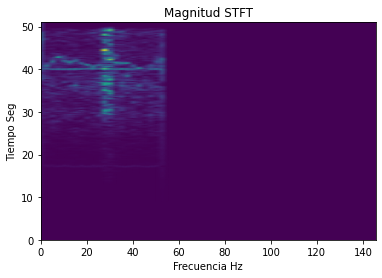

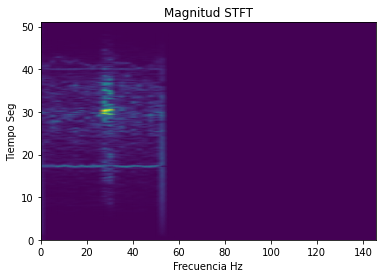

STFT para las señales: 15


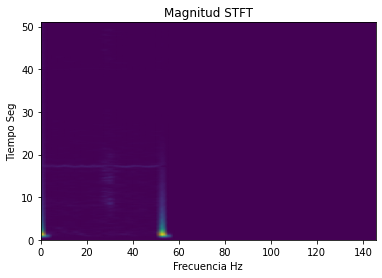

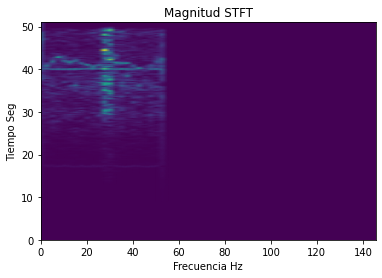

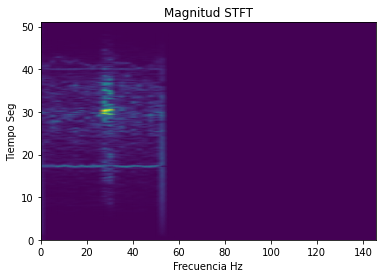

STFT para las señales: 16


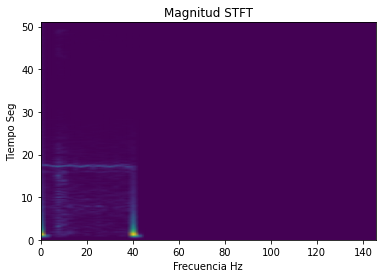

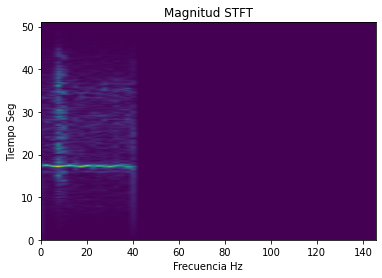

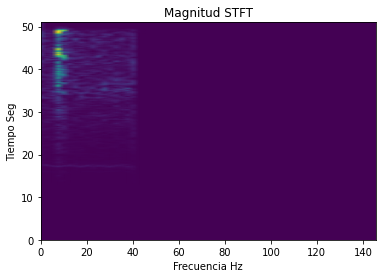

STFT para las señales: 17


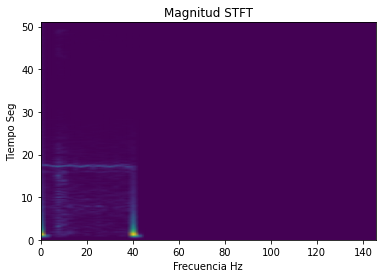

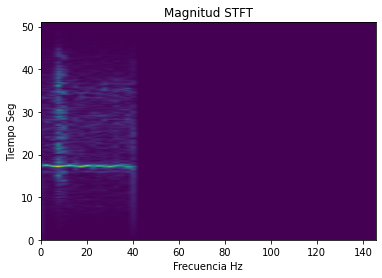

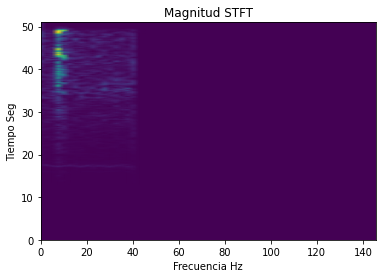

STFT para las señales: 18


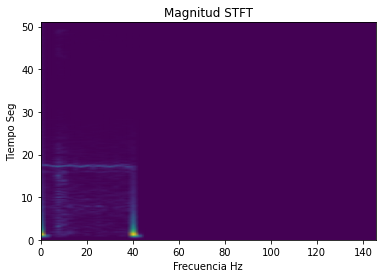

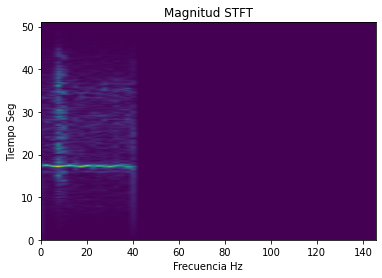

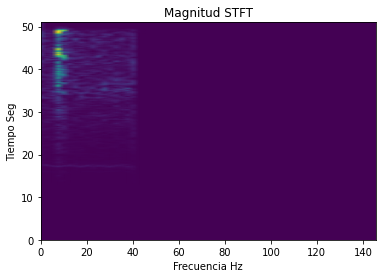

STFT para las señales: 19


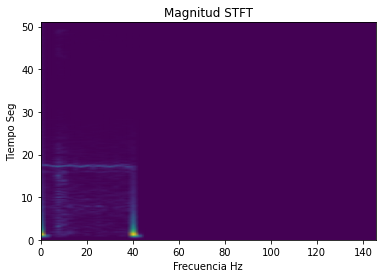

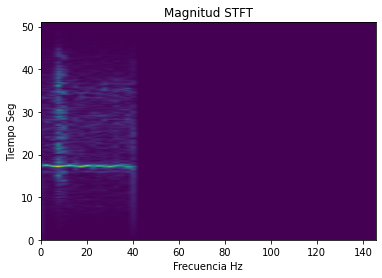

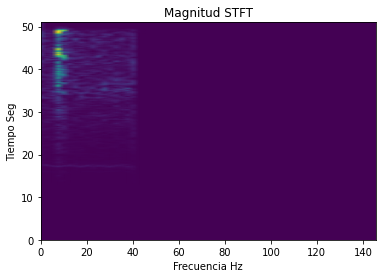

STFT para las señales: 20


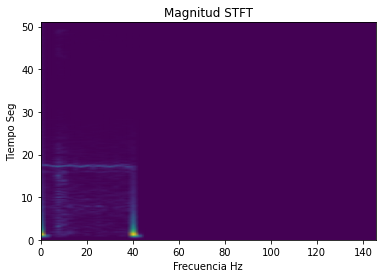

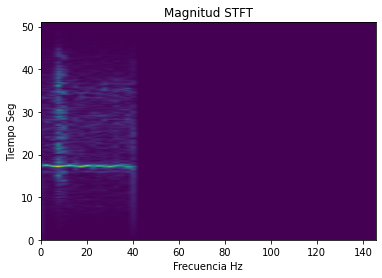

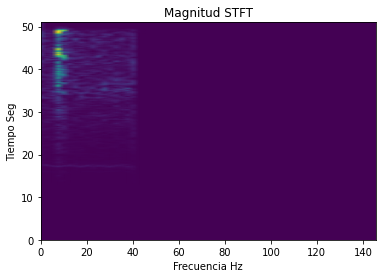

STFT para las señales: 21


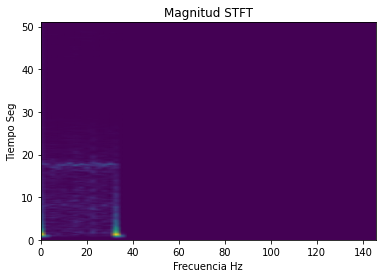

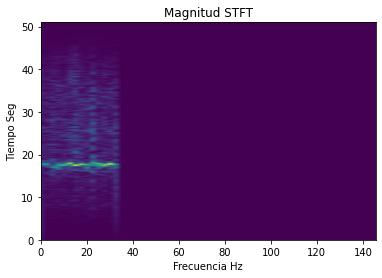

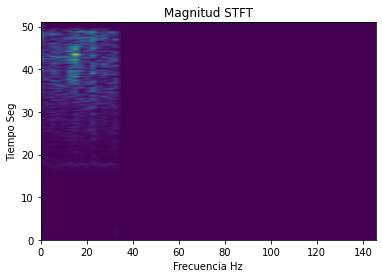

In [129]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (0,21):
  print('STFT para las señales:', i+1)
  for j in range (0,3):
    #plt.figure(1, figsize=(20, 60))
    fL,tL,ZxxL= signal.stft(LOCALssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxL)
    #plt.subplot(21, 3, i + j + 1)
    plt.pcolormesh(tL,fL,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()
    #print(absZxx)


# Características de cada una de las señales

In [130]:
#Funcion para el cálculo de la energía.
def signalEnergy(signalInput):
  sum = 0
  for k in range(len(signalInput)):
    sum+=pow(signalInput[k],2)     
  sigEnergy = sum
  return sigEnergy 

In [131]:
#Función para obtener las carateristicas
def extract_features(Zxx, f, ssa):
  # En la matriz Zxx se tiene una matriz de #defrecs * #times
  # Zxx[i,j], sería el espectro en la frecuencia[i] y el tiempo [j]  
  absZxx = np.abs(Zxx)
  #print(absZxx)
  maxP = np.max(absZxx)
  #print('Potencia máx:',maxP)
  id = np.where(absZxx==maxP)
  frecPmax = np.squeeze(f[id[0]])
  #print('Frecuencia de Pmáx:',frecPmax)
  energy=signalEnergy(ssa)
  #print('Energia:',energy)
  maxF = np.max(absZxx,axis=1)
  meanP = np.mean(maxF)
  #print('Media:',meanP)
  varP = np.var(maxF)
  #print('Varianza:',meanP)
  maxSpectrum = np.max(maxF)
  minSpectrum = np.min(maxF)

  datos = np.random.rand(7)
  datos[0] = maxP
  datos[1]= frecPmax
  datos[2] = energy
  datos[3] = meanP
  datos[4] = varP
  datos[5] = maxSpectrum
  datos[6] = minSpectrum

  return datos  

In [132]:
#-------------------------------------------------------------CARACTERISRICAS
datosLoc=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fL,tL,ZxxL= signal.stft(LOCALssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxL,fL,LOCALssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosLoc[i:] = datofila
print( datosLoc)

[[3.06904954e-02 1.39453125e+00 5.83314700e+00 3.33850834e-03
  2.39740911e-05 3.06904954e-02 9.52043291e-05 1.10260982e-02
  2.41054688e+01 1.89202134e+00 1.42197036e-03 1.86227292e-06
  1.10260982e-02 6.56664890e-05 7.23669772e-03 4.86093750e+01
  1.17879608e+00 1.37749594e-03 2.63763275e-06 7.23669772e-03
  2.68789661e-05]
 [3.50687543e-02 1.39453125e+00 6.95543412e+00 3.84946395e-03
  3.15232651e-05 3.50687543e-02 1.50643560e-04 4.96627455e-03
  2.98828125e+01 8.10111086e-01 1.33176551e-03 7.57800184e-07
  4.96627455e-03 1.13099317e-04 4.84949948e-03 4.00429688e+01
  9.16367469e-01 1.14671135e-03 1.28135868e-06 4.84949948e-03
  5.95538987e-05]
 [1.77693089e-02 1.39453125e+00 2.23153990e+00 2.75853661e-03
  7.68727286e-06 1.77693089e-02 3.31027765e-05 7.49497886e-03
  4.14375000e+01 1.10410771e+00 2.32675345e-03 2.26047182e-06
  7.49497886e-03 8.52786765e-05 7.32828298e-03 3.02812500e+01
  1.05670153e+00 2.18426782e-03 3.23450517e-06 7.32828298e-03
  8.93940633e-05]
 [1.77693089e-02

## Realizamos el mismo procedimiento tanto para Sismo Regional como Telesismo


# Sismo Regional

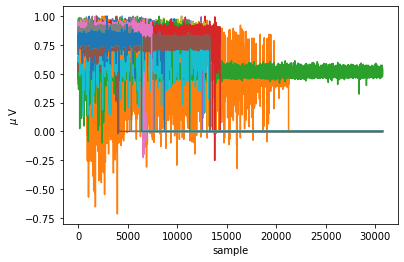

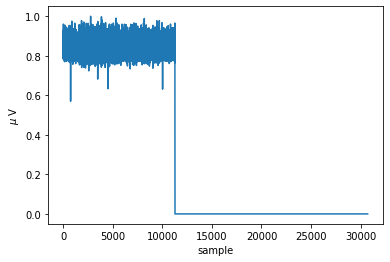

In [133]:
dataReg = sc.loadmat('sisReg.mat')#retorna los datos que lee de matlab
dataReg.keys() # variables del diccionario

X = dataReg['Y']#Son variables
fs = dataReg['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(X.T)#trasponer
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

sampleSignal = X[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

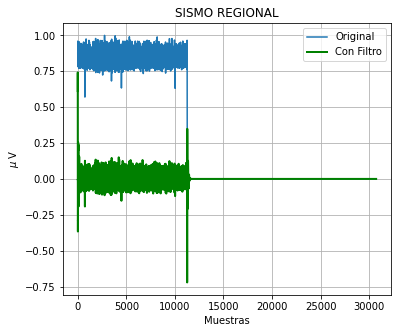

In [134]:
#------------------------------------------------------fILTRADO
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 49
order = 6

signalFilteredReg = np.zeros((21,30720))

for i in range(0,21):
  signalFilteredReg[i,:] = butter_bandpass_filter(X[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(X[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredReg[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO REGIONAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

<function matplotlib.pyplot.show>

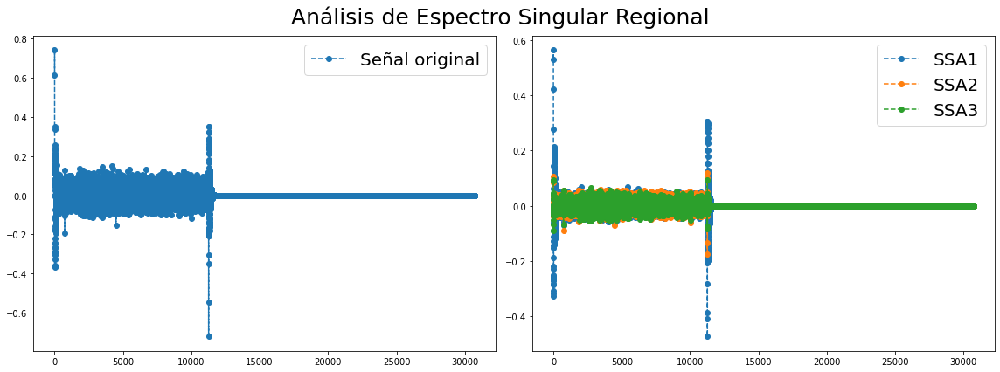

In [135]:
REGIONAL = signalFilteredReg
Grup1= 3
SSA1= SingularSpectrumAnalysis(window_size=Grup1)
REGIONALssa = SSA1.fit_transform(REGIONAL)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Regional',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(REGIONAL[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup1):
  ax2.plot(REGIONALssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff669731990>,
 [<matplotlib.lines.Line2D at 0x7ff66972c0d0>])

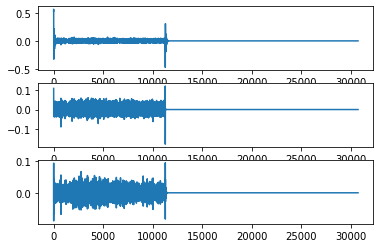

In [136]:
plt.subplot(3,1,1),plt.plot(REGIONALssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(REGIONALssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(REGIONALssa[idsignal, 2])

STFT para las señales: 1


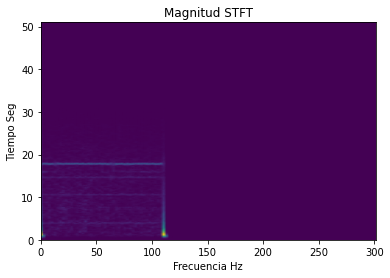

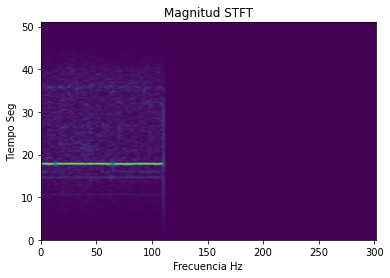

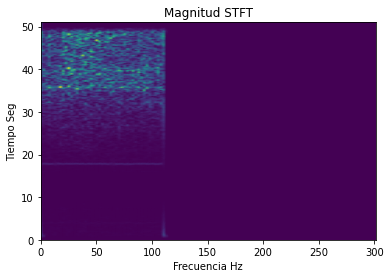

STFT para las señales: 2


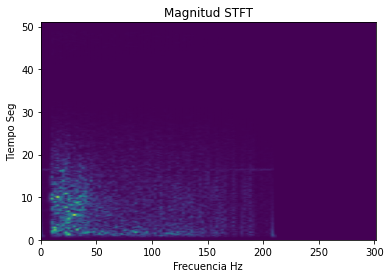

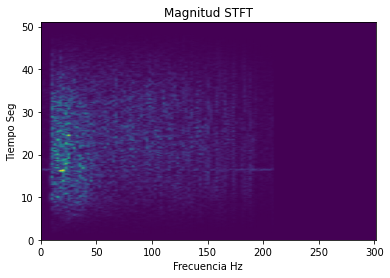

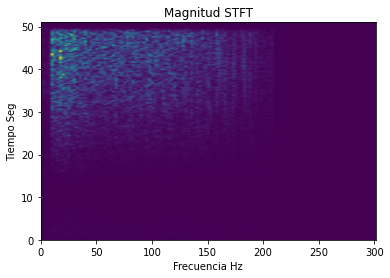

STFT para las señales: 3


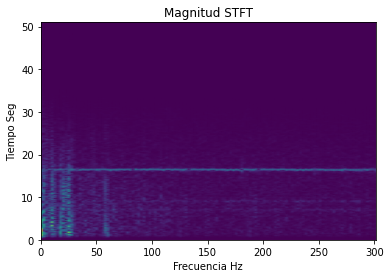

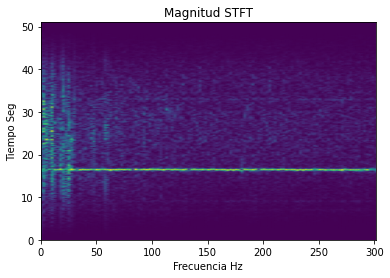

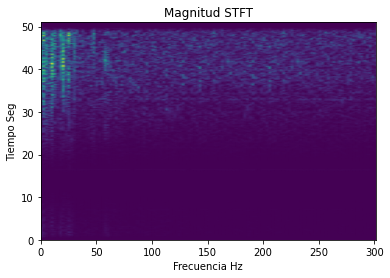

STFT para las señales: 4


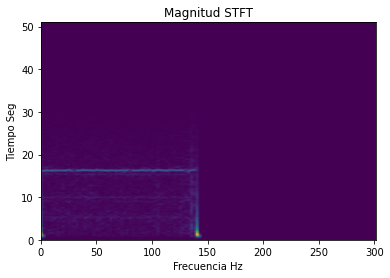

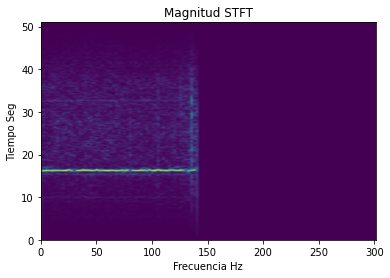

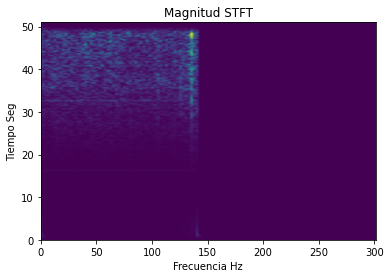

STFT para las señales: 5


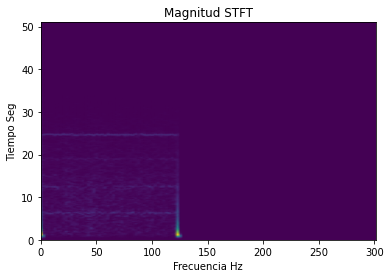

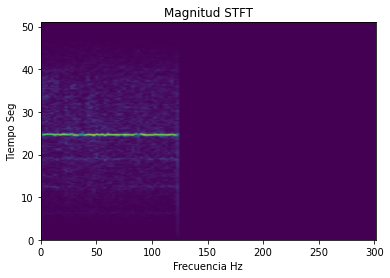

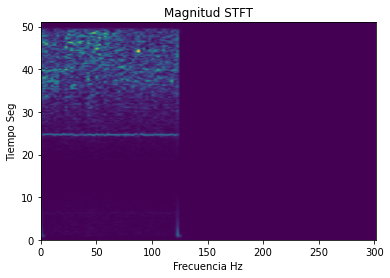

STFT para las señales: 6


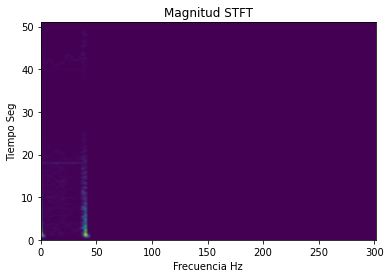

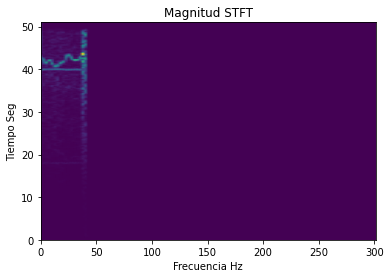

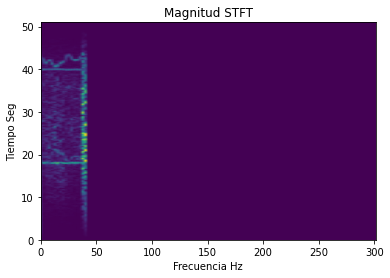

STFT para las señales: 7


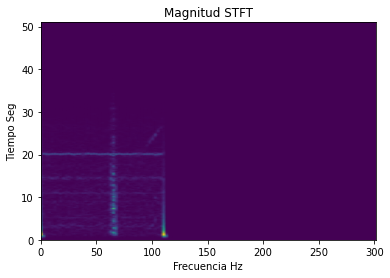

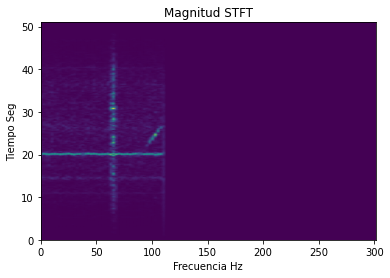

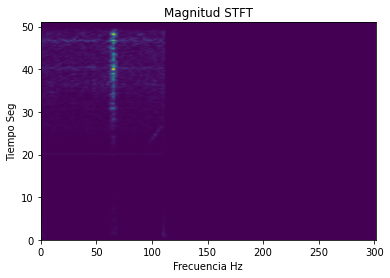

STFT para las señales: 8


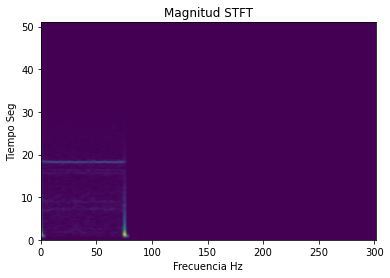

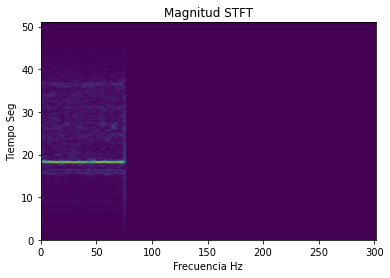

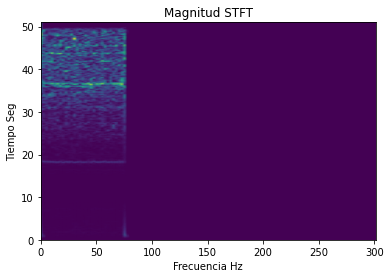

STFT para las señales: 9


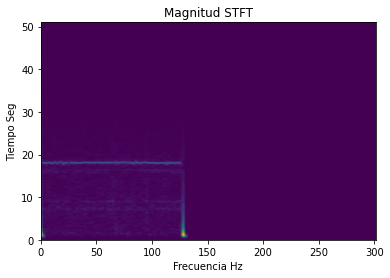

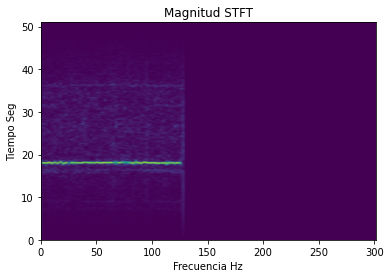

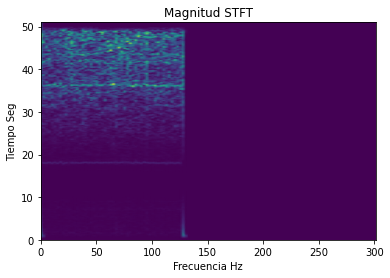

STFT para las señales: 10


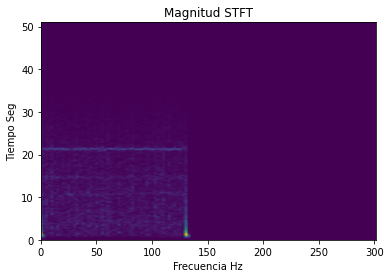

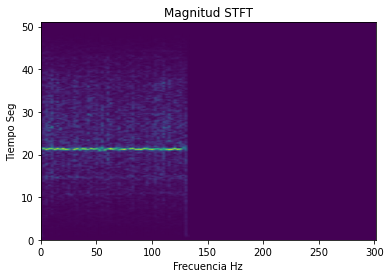

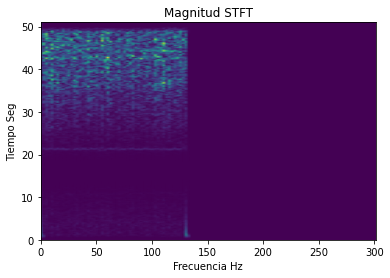

STFT para las señales: 11


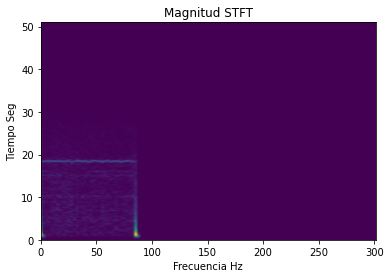

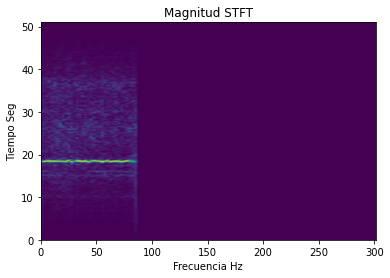

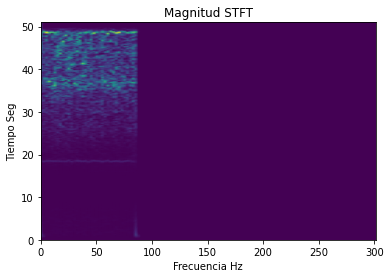

STFT para las señales: 12


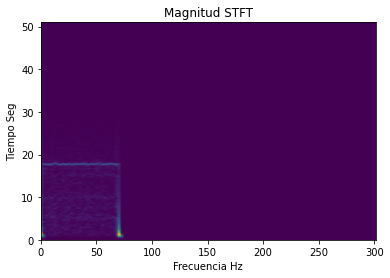

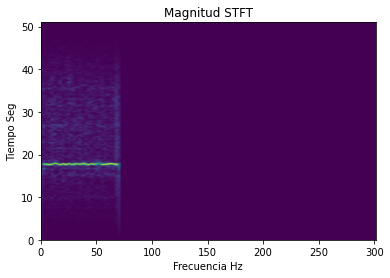

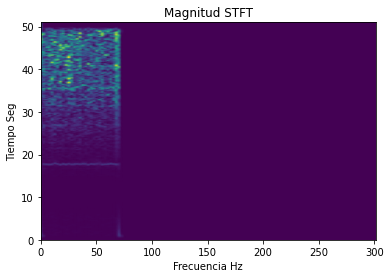

STFT para las señales: 13


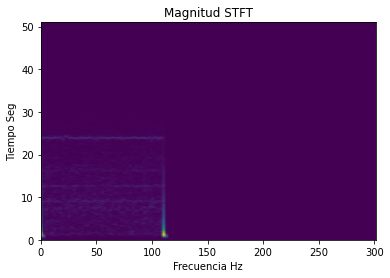

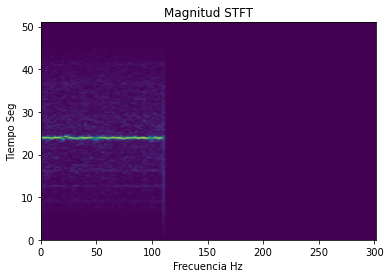

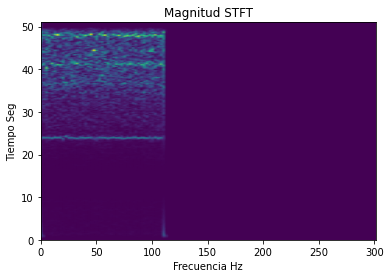

STFT para las señales: 14


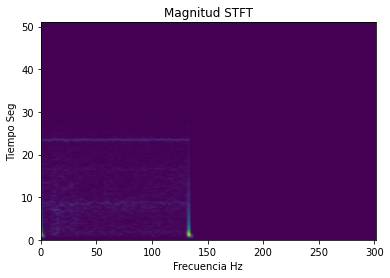

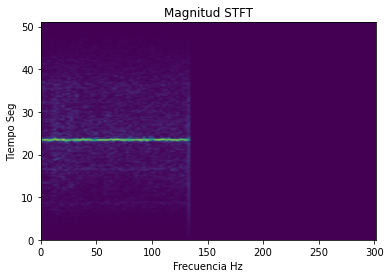

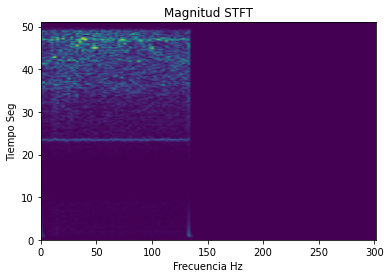

STFT para las señales: 15


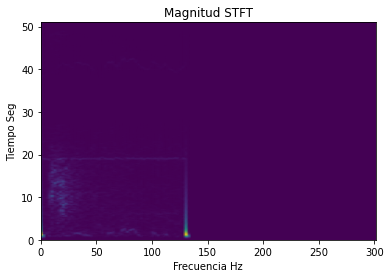

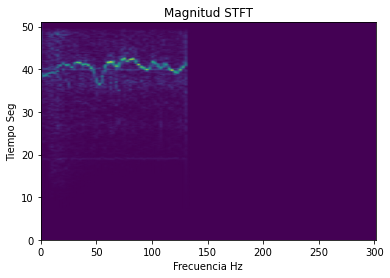

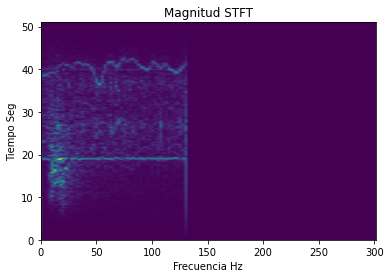

STFT para las señales: 16


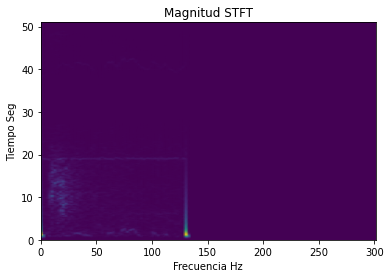

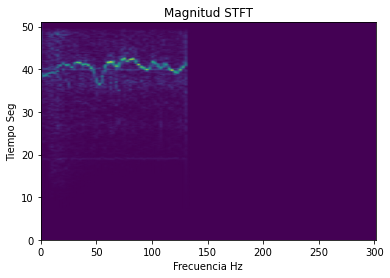

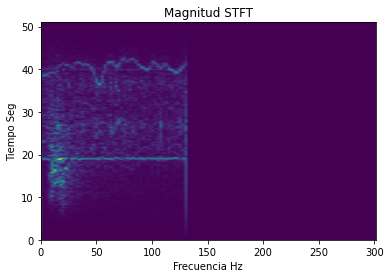

STFT para las señales: 17


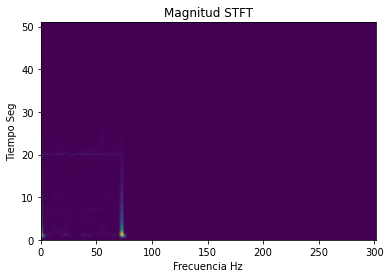

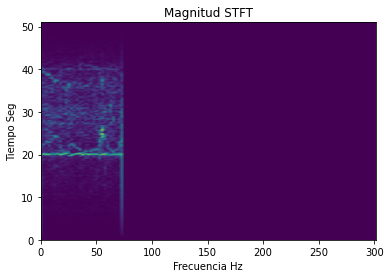

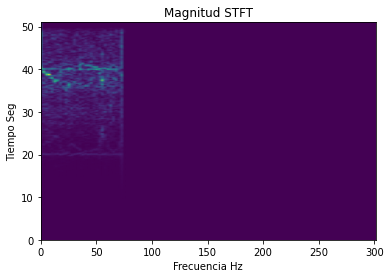

STFT para las señales: 18


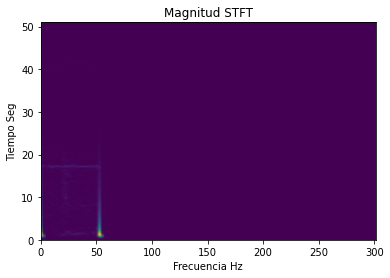

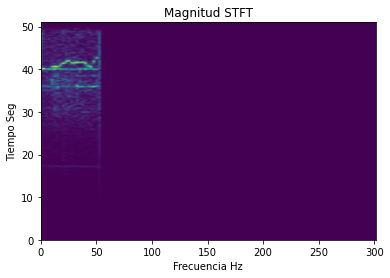

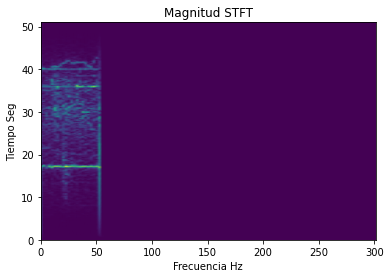

STFT para las señales: 19


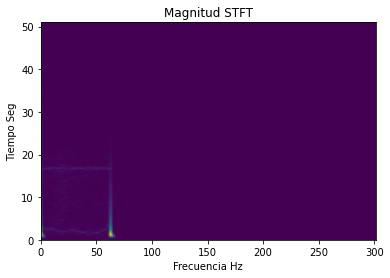

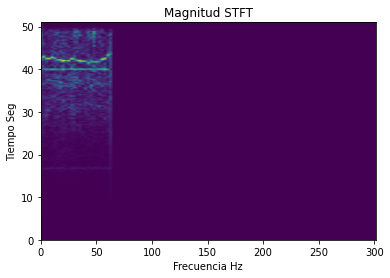

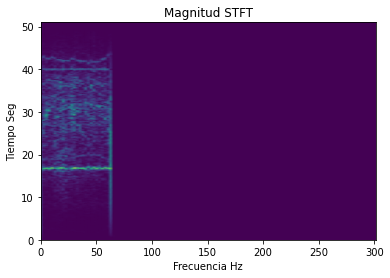

STFT para las señales: 20


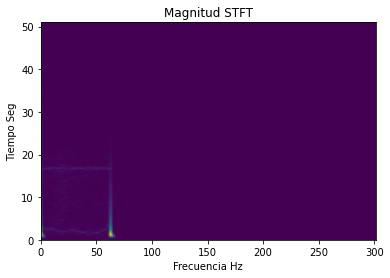

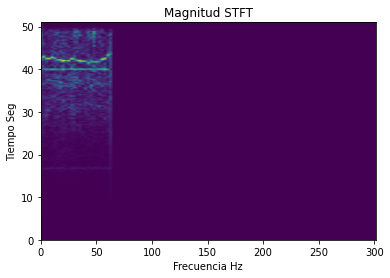

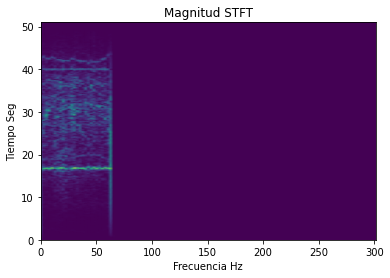

STFT para las señales: 21


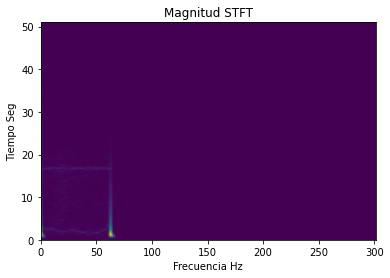

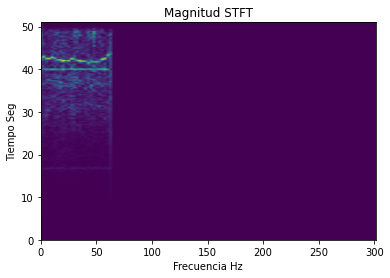

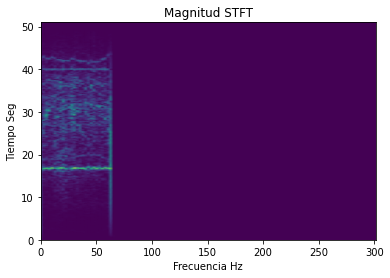

In [137]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (21):
  print('STFT para las señales:', i+1)
  for j in range (3):
    fR,tR,ZxxR= signal.stft(REGIONALssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxR)
    plt.pcolormesh(tR,fR,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()



In [138]:
datosReg=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fR,tR,ZxxR= signal.stft(REGIONALssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxR,fR,REGIONALssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosReg[i:] = datofila
print( datosReg)

[[3.40431315e-02 1.39453125e+00 9.82903866e+00 3.77927079e-03
  3.04822879e-05 3.40431315e-02 1.38189171e-04 1.15562299e-02
  1.79296875e+01 4.14331340e+00 1.40282090e-03 1.33243352e-06
  1.15562299e-02 1.00181021e-04 4.69398654e-03 3.58593750e+01
  2.31600332e+00 1.20099695e-03 1.57350133e-06 4.69398654e-03
  3.45605062e-05]
 [7.04124863e-02 5.97656250e+00 2.37163593e+02 1.30543241e-02
  2.86866947e-04 7.04124863e-02 1.32772558e-04 3.25556483e-02
  1.63359375e+01 7.54402206e+01 9.23637432e-03 4.75819666e-05
  3.25556483e-02 1.06777472e-04 2.74361404e-02 4.36289062e+01
  6.06480208e+01 6.32119287e-03 4.66551736e-05 2.74361404e-02
  9.50741168e-06]
 [1.86133665e-02 2.19140625e+00 1.32360650e+01 3.46772540e-03
  1.73444837e-05 1.86133665e-02 1.55546977e-04 6.83566627e-03
  1.65351562e+01 6.94784829e+00 2.42710601e-03 2.90099364e-06
  6.83566627e-03 9.20665607e-05 7.16310344e-03 4.14375000e+01
  5.07550540e+00 1.86279328e-03 3.83213480e-06 7.16310344e-03
  2.67388592e-05]
 [3.42337777e-02

# Sismo Tele

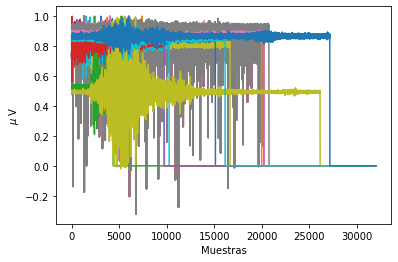

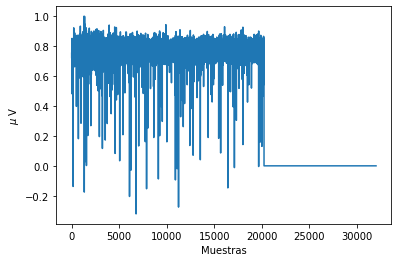

In [139]:
dataTele = sc.loadmat('sisTele.mat')#retorna los datos que lee de matlab
dataReg.keys() # variables del diccionario

Z = dataTele['Y']#Son variables
fs3 = dataTele['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(Z.T)#trasponer
plt.xlabel('Muestras')
plt.ylabel('$\mu$ V')
plt.show()

sampleSignal = Z[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('Muestras')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

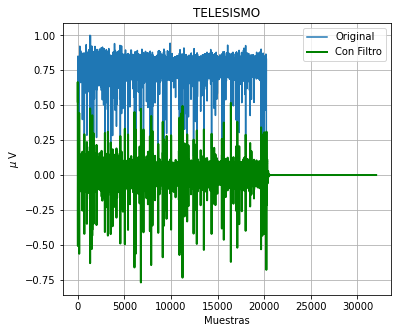

In [140]:
#------------------------------------------------------fILTRADO
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 49
order = 6

signalFilteredTele = np.zeros((21,32000))

for i in range(0,21):
  signalFilteredTele[i,:] = butter_bandpass_filter(Z[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Z[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredTele[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("TELESISMO"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

<function matplotlib.pyplot.show>

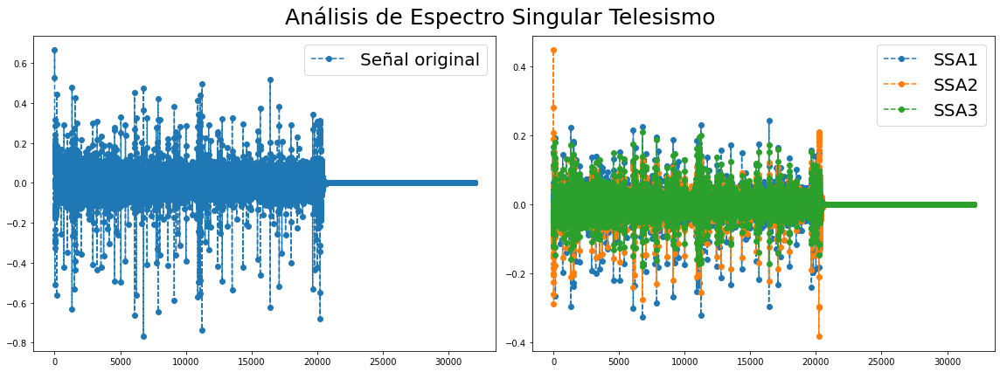

In [141]:
TELESISMO = signalFilteredTele
Grup2= 3
SSA2= SingularSpectrumAnalysis(window_size=Grup2)
TELESISMOssa = SSA2.fit_transform(signalFilteredTele)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Telesismo',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(TELESISMO[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup2):
  ax2.plot(TELESISMOssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff6695d6410>,
 [<matplotlib.lines.Line2D at 0x7ff66bb1fad0>])

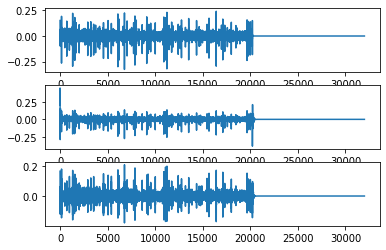

In [142]:
plt.subplot(3,1,1),plt.plot(TELESISMOssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(TELESISMOssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(TELESISMOssa[idsignal, 2])

STFT para las señales: 1


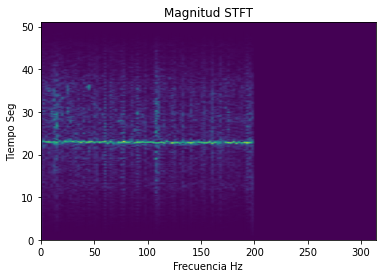

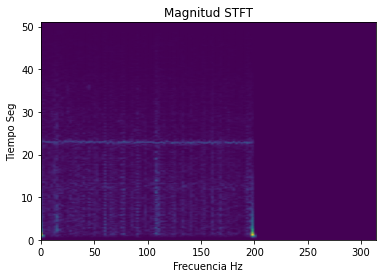

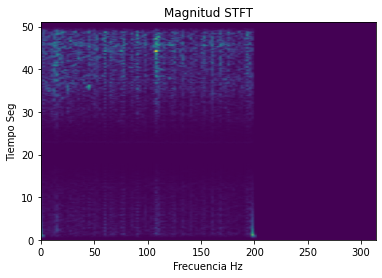

STFT para las señales: 2


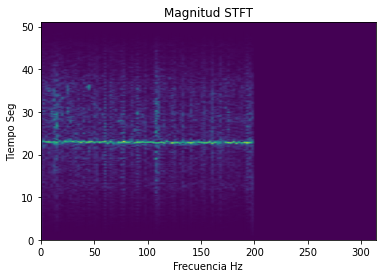

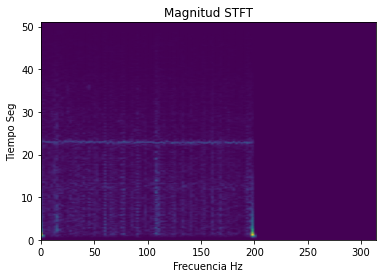

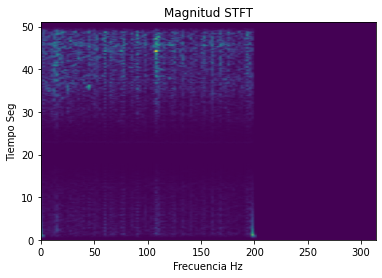

STFT para las señales: 3


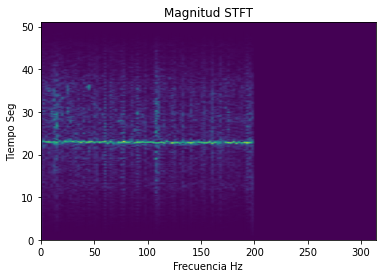

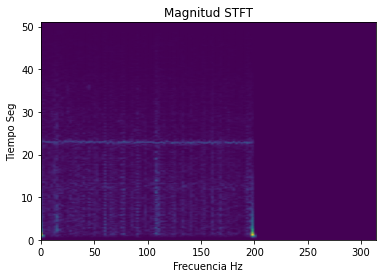

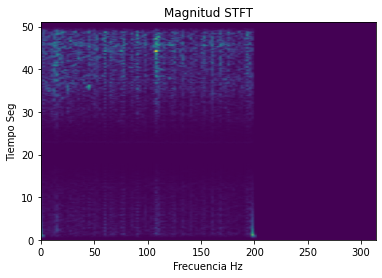

STFT para las señales: 4


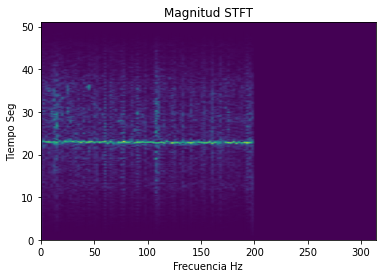

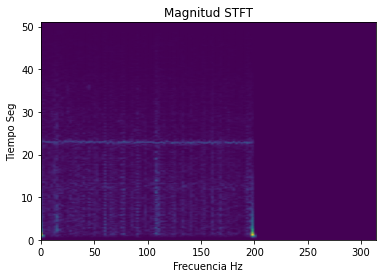

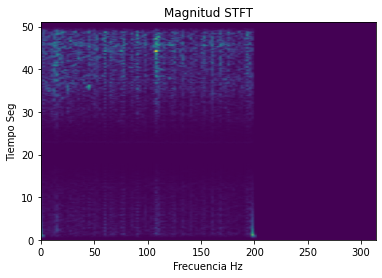

STFT para las señales: 5


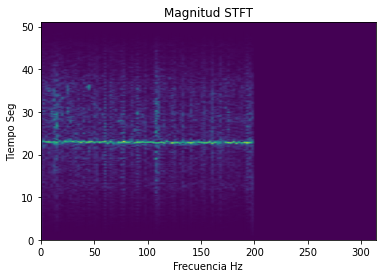

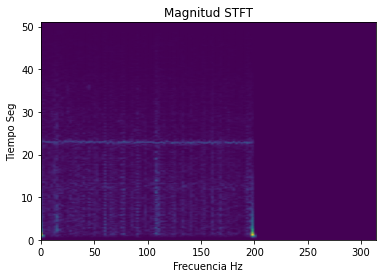

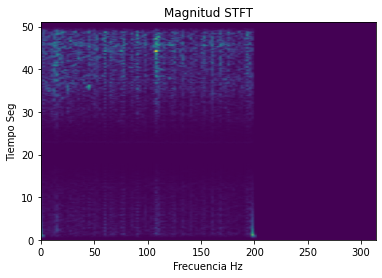

STFT para las señales: 6


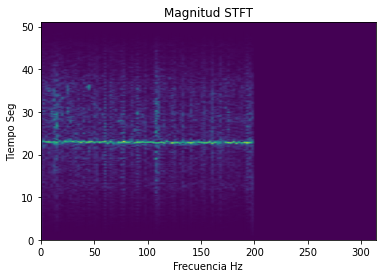

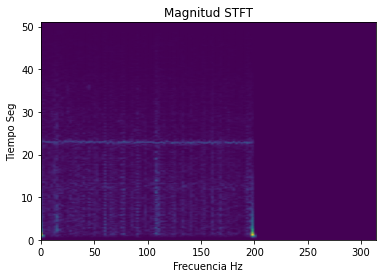

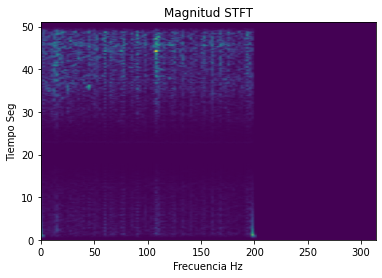

STFT para las señales: 7


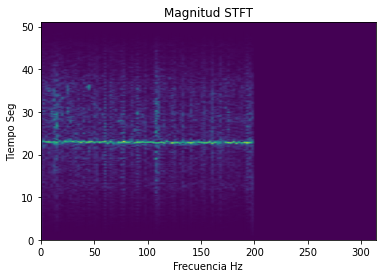

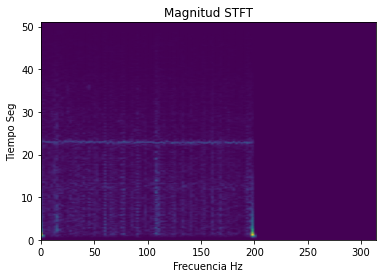

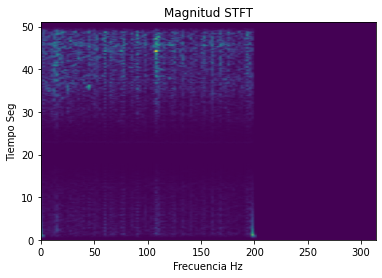

STFT para las señales: 8


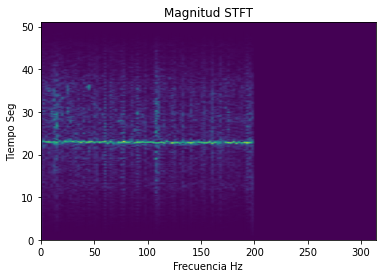

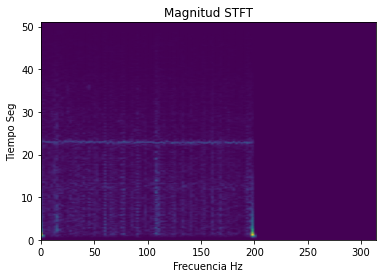

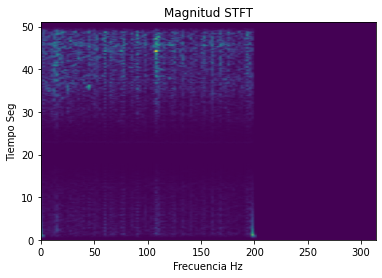

STFT para las señales: 9


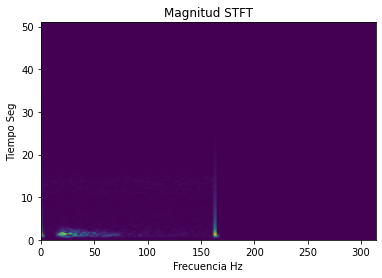

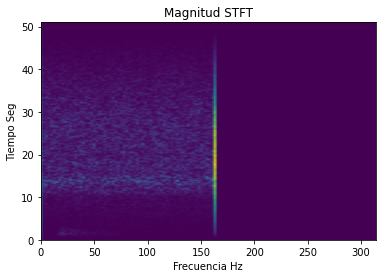

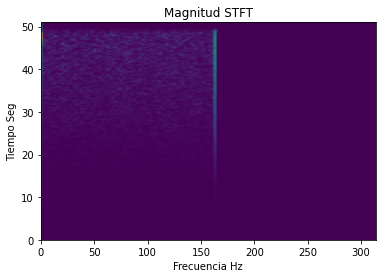

STFT para las señales: 10


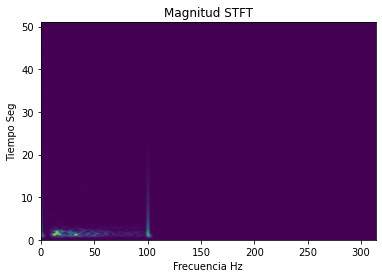

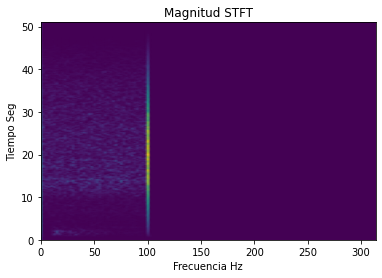

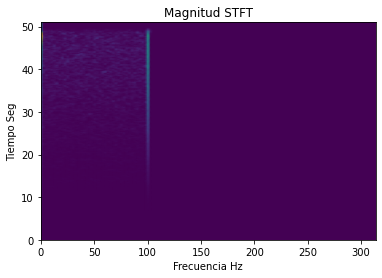

STFT para las señales: 11


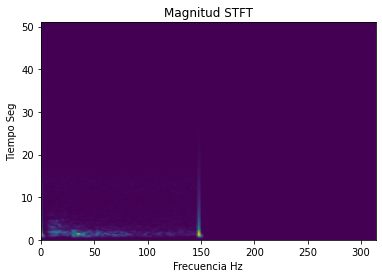

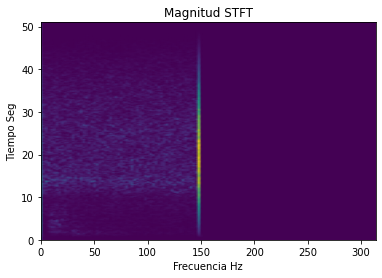

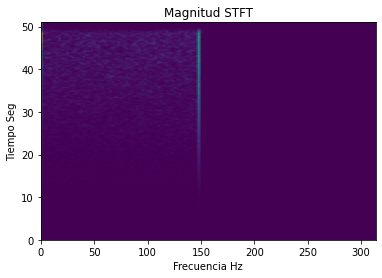

STFT para las señales: 12


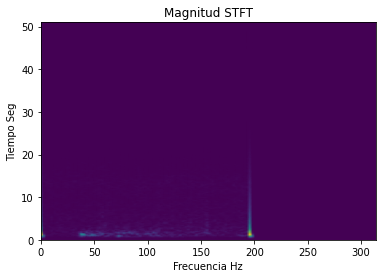

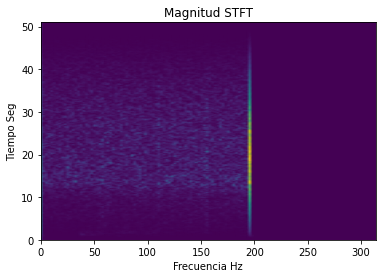

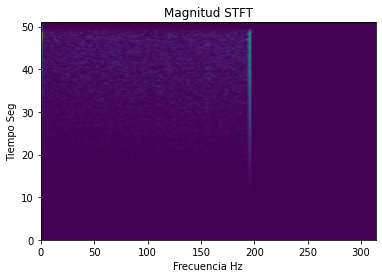

STFT para las señales: 13


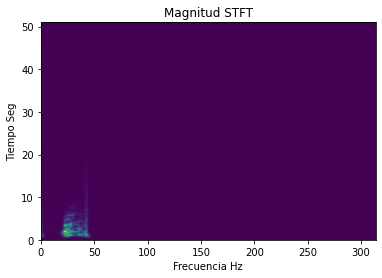

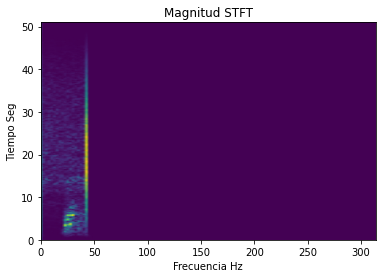

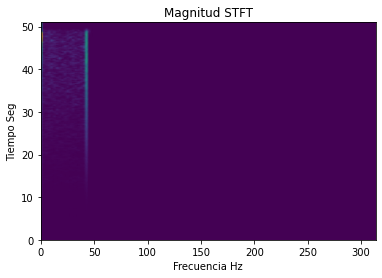

STFT para las señales: 14


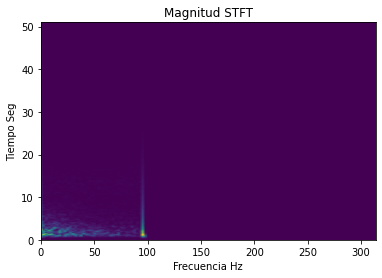

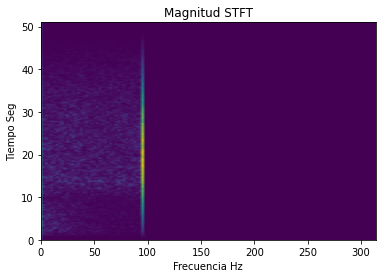

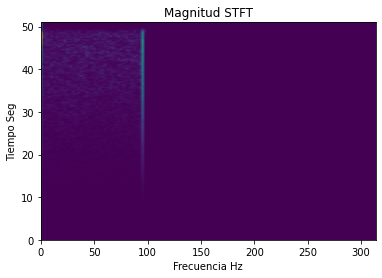

STFT para las señales: 15


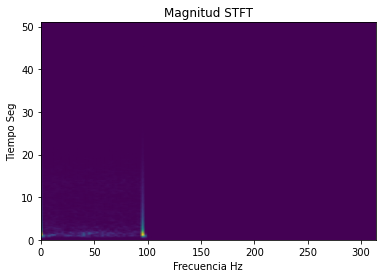

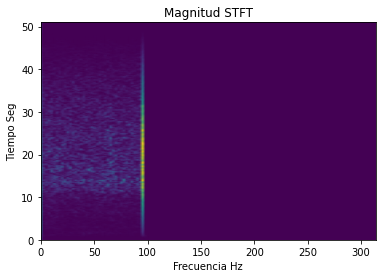

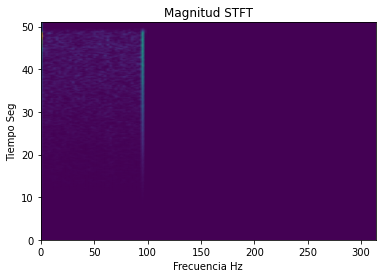

STFT para las señales: 16


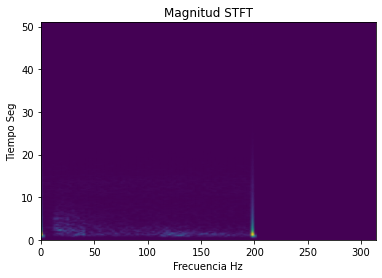

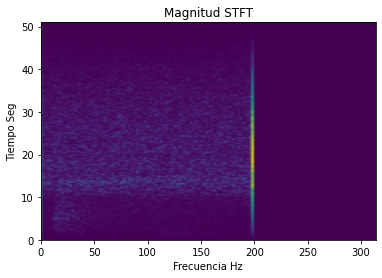

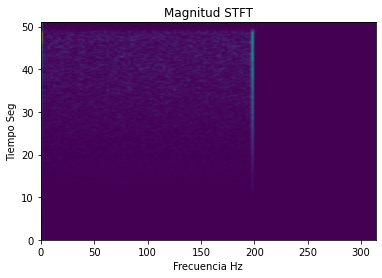

STFT para las señales: 17


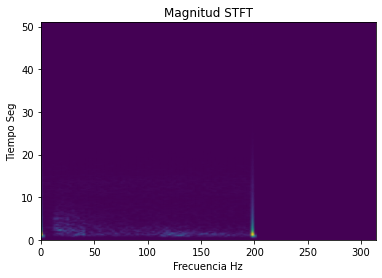

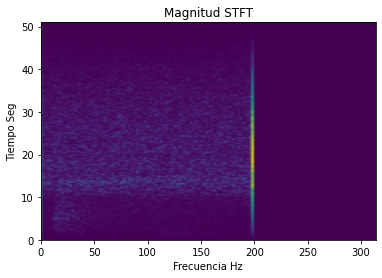

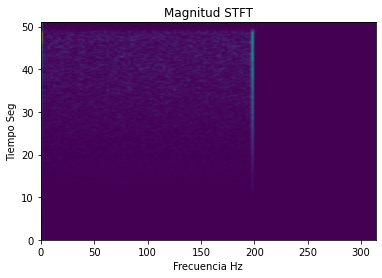

STFT para las señales: 18


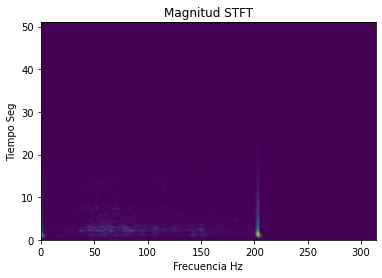

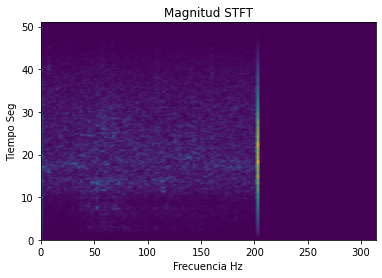

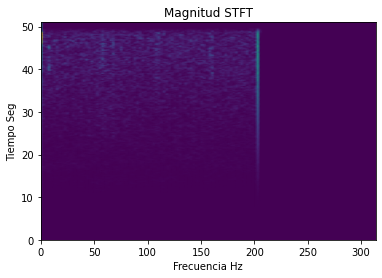

STFT para las señales: 19


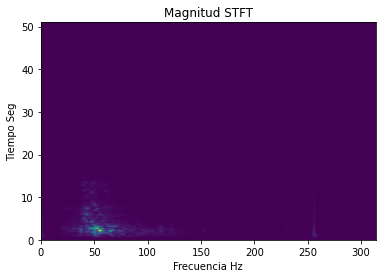

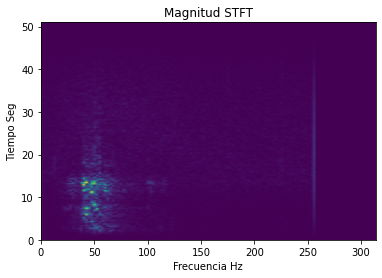

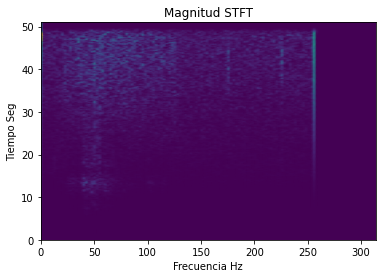

STFT para las señales: 20


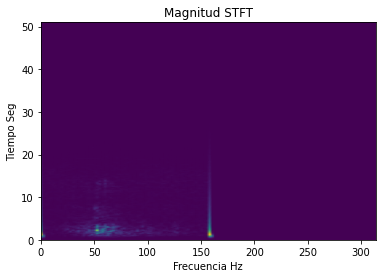

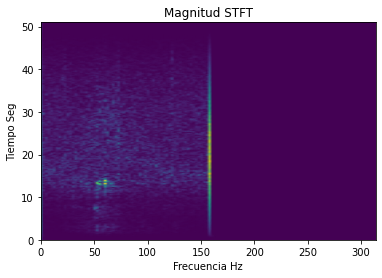

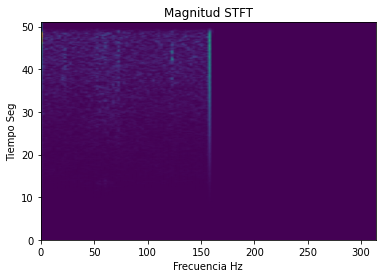

STFT para las señales: 21


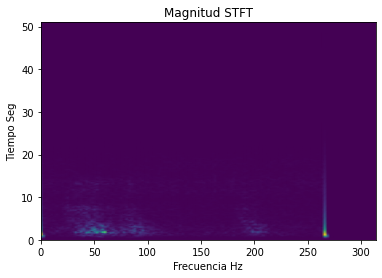

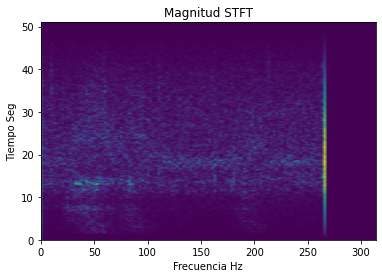

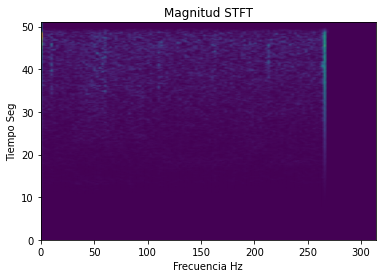

In [143]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (0,21):
  print('STFT para las señales:', i+1)
  for j in range (0,3):
    fT,tT,ZxxT= signal.stft(TELESISMOssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxT)
    plt.pcolormesh(tT,fT,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()

In [144]:
datosTele=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fT,tT,ZxxT= signal.stft(TELESISMOssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxT,fT,TELESISMOssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosTele[i:] = datofila
print( datosTele)

[[1.33765022e-02 2.31093750e+01 1.37580048e+01 2.82353866e-03
  5.00742637e-06 1.33765022e-02 2.01680949e-04 2.40431043e-02
  1.19531250e+00 1.13497467e+01 3.22233453e-03 1.43941519e-05
  2.40431043e-02 2.67525489e-04 1.20078284e-02 4.44257812e+01
  9.61450382e+00 2.66513972e-03 5.76180888e-06 1.20078284e-02
  2.01495565e-05]
 [1.33765022e-02 2.31093750e+01 1.37580048e+01 2.82353866e-03
  5.00742637e-06 1.33765022e-02 2.01680949e-04 2.40431043e-02
  1.19531250e+00 1.13497467e+01 3.22233453e-03 1.43941519e-05
  2.40431043e-02 2.67525489e-04 1.20078284e-02 4.44257812e+01
  9.61450382e+00 2.66513972e-03 5.76180888e-06 1.20078284e-02
  2.01495565e-05]
 [1.33765022e-02 2.31093750e+01 1.37580048e+01 2.82353866e-03
  5.00742637e-06 1.33765022e-02 2.01680949e-04 2.40431043e-02
  1.19531250e+00 1.13497467e+01 3.22233453e-03 1.43941519e-05
  2.40431043e-02 2.67525489e-04 1.20078284e-02 4.44257812e+01
  9.61450382e+00 2.66513972e-03 5.76180888e-06 1.20078284e-02
  2.01495565e-05]
 [1.33765022e-02

In [145]:
print(datosTele.size)

441


# Concatenamos las tres matices, Sismo Local, Sismo Regional y Telesismo:

In [146]:
Matriz = np.concatenate((datosLoc,datosReg,datosTele),axis=0)

In [147]:
df = pd.DataFrame(Matriz,columns=['Pmax','F_Pmax', 'Energia','Media','Var','Max','Min','Pmax1','F_Pmax1','Energia1','Media1','Var1','Max1','Min1','Pmax2','F_Pmax2','Energia2','Media2','Var2','Max2','Min2'])

Identificamos cada una de las señales cuantificando sus parámetros principales:

In [148]:
df

,Pmax,F_Pmax,Energia,Media,Var,Max,Min,Pmax1,F_Pmax1,Energia1,Media1,Var1,Max1,Min1,Pmax2,F_Pmax2,Energia2,Media2,Var2,Max2,Min2
0,0.030690,1.394531,5.833147,0.003339,0.000024,0.030690,0.000095,0.011026,24.105469,1.892021,0.001422,1.862273e-06,0.011026,0.000066,0.007237,48.609375,1.178796,0.001377,2.637633e-06,0.007237,0.000027
1,0.035069,1.394531,6.955434,0.003849,0.000032,0.035069,0.000151,0.004966,29.882812,0.810111,0.001332,7.578002e-07,0.004966,0.000113,0.004849,40.042969,0.916367,0.001147,1.281359e-06,0.004849,0.000060
2,0.017769,1.394531,2.231540,0.002759,0.000008,0.017769,0.000033,0.007495,41.437500,1.104108,0.002327,2.260472e-06,0.007495,0.000085,0.007328,30.281250,1.056702,0.002184,3.234505e-06,0.007328,0.000089
3,0.017769,1.394531,2.231540,0.002759,0.000008,0.017769,0.000033,0.007495,41.437500,1.104108,0.002327,2.260472e-06,0.007495,0.000085,0.007328,30.281250,1.056702,0.002184,3.234505e-06,0.007328,0.000089
4,0.034588,1.394531,6.763755,0.003826,0.000031,0.034588,0.000135,0.008284,45.820312,0.675259,0.001138,1.948918e-06,0.008284,0.000070,0.003966,16.933594,0.352703,0.001175,4.617970e-07,0.003966,0.000118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.036803,1.394531,10.970736,0.004017,0.000035,0.036803,0.000180,0.001947,18.527344,0.200361,0.001022,3.229670e-07,0.001947,0.000116,0.002841,48.210938,0.137543,0.000734,4.521055e-07,0.002841,0.000068
59,0.038706,1.394531,10.357635,0.004172,0.000038,0.038706,0.000203,0.002181,18.328125,0.276306,0.001080,3.532713e-07,0.002181,0.000139,0.002980,48.410156,0.211563,0.000768,4.963775e-07,0.002980,0.000069
60,0.157015,2.390625,141.172748,0.008929,0.000473,0.157015,0.000156,0.006576,13.546875,0.810770,0.001179,1.684775e-06,0.006576,0.000092,0.001742,48.210938,0.107883,0.000424,1.403203e-07,0.001742,0.000037
61,0.035705,1.394531,11.028358,0.003885,0.000034,0.035705,0.000204,0.001980,13.945312,0.218484,0.000999,3.031167e-07,0.001980,0.000128,0.002746,48.410156,0.165807,0.000708,4.184928e-07,0.002746,0.000066


In [149]:
Etiquetas = np.zeros((63,1))
Etiquetas[0:21] = 0
Etiquetas[21:42] = 1
Etiquetas[42:] = 2


In [150]:
df['Etiquetas'] = Etiquetas


Realizamos las respectivas etiquetas donde quedan relacionadas de la siguiente manera :

*$0$ para Sismo  Local*

*$1$ para Sismo Regional*

*$2$ para Telesismo*



In [151]:
df

,Pmax,F_Pmax,Energia,Media,Var,Max,Min,Pmax1,F_Pmax1,Energia1,Media1,Var1,Max1,Min1,Pmax2,F_Pmax2,Energia2,Media2,Var2,Max2,Min2,Etiquetas
0,0.030690,1.394531,5.833147,0.003339,0.000024,0.030690,0.000095,0.011026,24.105469,1.892021,0.001422,1.862273e-06,0.011026,0.000066,0.007237,48.609375,1.178796,0.001377,2.637633e-06,0.007237,0.000027,0.0
1,0.035069,1.394531,6.955434,0.003849,0.000032,0.035069,0.000151,0.004966,29.882812,0.810111,0.001332,7.578002e-07,0.004966,0.000113,0.004849,40.042969,0.916367,0.001147,1.281359e-06,0.004849,0.000060,0.0
2,0.017769,1.394531,2.231540,0.002759,0.000008,0.017769,0.000033,0.007495,41.437500,1.104108,0.002327,2.260472e-06,0.007495,0.000085,0.007328,30.281250,1.056702,0.002184,3.234505e-06,0.007328,0.000089,0.0
3,0.017769,1.394531,2.231540,0.002759,0.000008,0.017769,0.000033,0.007495,41.437500,1.104108,0.002327,2.260472e-06,0.007495,0.000085,0.007328,30.281250,1.056702,0.002184,3.234505e-06,0.007328,0.000089,0.0
4,0.034588,1.394531,6.763755,0.003826,0.000031,0.034588,0.000135,0.008284,45.820312,0.675259,0.001138,1.948918e-06,0.008284,0.000070,0.003966,16.933594,0.352703,0.001175,4.617970e-07,0.003966,0.000118,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.036803,1.394531,10.970736,0.004017,0.000035,0.036803,0.000180,0.001947,18.527344,0.200361,0.001022,3.229670e-07,0.001947,0.000116,0.002841,48.210938,0.137543,0.000734,4.521055e-07,0.002841,0.000068,2.0
59,0.038706,1.394531,10.357635,0.004172,0.000038,0.038706,0.000203,0.002181,18.328125,0.276306,0.001080,3.532713e-07,0.002181,0.000139,0.002980,48.410156,0.211563,0.000768,4.963775e-07,0.002980,0.000069,2.0
60,0.157015,2.390625,141.172748,0.008929,0.000473,0.157015,0.000156,0.006576,13.546875,0.810770,0.001179,1.684775e-06,0.006576,0.000092,0.001742,48.210938,0.107883,0.000424,1.403203e-07,0.001742,0.000037,2.0
61,0.035705,1.394531,11.028358,0.003885,0.000034,0.035705,0.000204,0.001980,13.945312,0.218484,0.000999,3.031167e-07,0.001980,0.000128,0.002746,48.410156,0.165807,0.000708,4.184928e-07,0.002746,0.000066,2.0


## Observamos el comportamiento de cada uno de los sistemas por parámetro: 
*Rosado: Telesismo*

*Azul: Sismo Local*

*Verde: Sismo Regional*

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


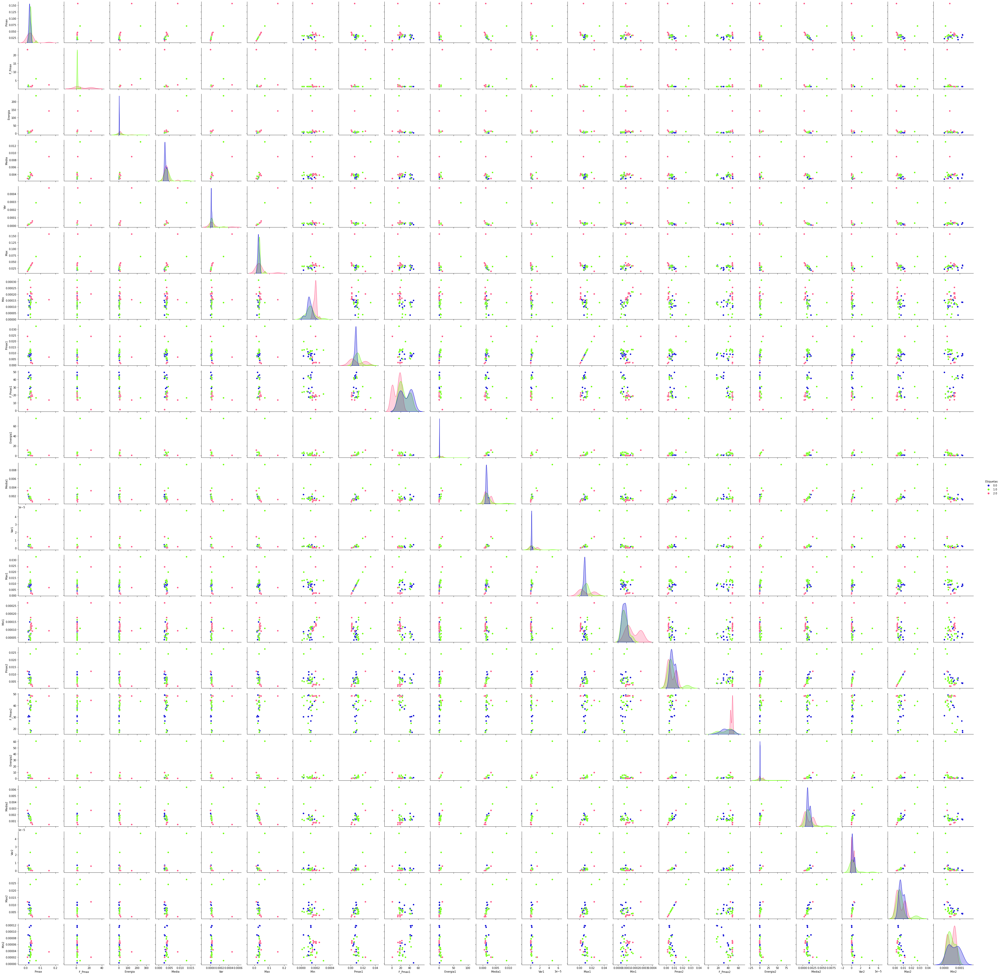

In [152]:
color = ["#0002d5","#67ff00","#ff4d80"]
sns.pairplot(df, hue="Etiquetas",height=2.5, palette=color)



*   Podemos observar que los componentes de la diagonal principal de toda la grafica, corresponde a la coincidencia del parametro en los ejes pincipales.

* En la mayoria de los gráficos de la diagonal principal predominan en ampliltud los sistemas de Telesismo y sismo Local, teniendo como caso particular en F_Pmax2 la amplitud del Sistema Regional, mayor.

* El comportamiento que observamos en las primeras columnas es correspondiente a la primera señal subyacente, es muy similar en los valores del eje $x$, tomando variaciones en el parametro evaluado del eje $y$, presentandose un comportamiento con dispersión lineal y en algunos con poca dispersión.

* Donde encontramos mayor dispersión es en el sistema regional aunque identificamos el mismo comportamiento anterior con respecto a la dispersion lineal a la señal subyacente 1.

* En un comportamiento general de la graficas podemos apreciar, para el sistema Regional y telesismo, datos mas dispersos del grupo general de datos.

* En la columna de evaluacion de energía para los tres sistemas, todos los parametros tienen un valor tendiente a cero, visualizando unas dispersiones lineales a lo largo del eje $y$

* Vemos que la energia esta mayormente representada en los datos correspondientes a la diagonal principal, en los gráficos de la representacion de los valores locales en la tercera señal subyacente para el sistema telesismo.

* Para las señales de los tres sistemas en Pmax1 y Max1 tienen un comportamiento donde la variacion  de estos parametros es  similar mostrando así una dispersión lineal con pendiente positiva.

* Donde comparamaos  las energias de cada sistema con las energias de las diferentes señales suyacentes (Energia vs Energia, energia1 vs Energia1, Energia2 vs Energia 2) podemos ver que la energía se concentra en los datos locales.





# Observaciones Generales (Dificultades y soluciones)



*   Frente a una equivoca visualización de las dimensiones de las matrices se tuvieron complicaciones para obtener los graficos, donde se estaban dimensionando matrices de $189 filas *  7 columnas$, cuando debia ser $63 filas  21 columnas$.

*   Inicialmente se utilizó un filtro Pasa-Bajas pero al obtener los espectrogramas y las matrices concatenadas identificamos que la mayor parte de la potencia de la señal estaban cercanas al cero frecuencial haciendo que las demás frecuencias perdieran relevancia en los espectrogramas y no se lograran visualizar. Utilizamos un filtro Pasa-Bandas  para filtrar la frecuencia donde estaba concentrada la energía logrando visualizar, ahora si, las frecuencias que determinan el comportamiento de las diferentes señales al eliiminar un nivel DC que estaba implícito en la señal filtrada con pasa-bajas.

* Para el diagrama de Bode fue necesario acotar superiormente la frecuencia correpondiente al valor $50$ para que, junto con un orden $6$, poder obtener  una señal suave.

* Se adicionó una porcion de código para evaluar otros poosibles ordenes de filtrado para escoger el orden mas adecuado, donde obtuvimos señales deon algunas distorciones.



